# Load Data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
from sklearn.model_selection import train_test_split, cross_val_score
import seaborn as sns
from tabulate import tabulate
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor, export_text, plot_tree
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import learning_curve, cross_val_score
from sklearn.svm import SVC
from sklearn.datasets import load_digits
from sklearn.decomposition import PCA
from matplotlib.path import Path
plt.rcParams['font.size'] = 14

from google.colab import drive
drive.mount('/content/drive', force_remount=True)

MY_PATH = '/content/drive/MyDrive/Butterfly_Data/'

Mounted at /content/drive


In [2]:
study_area_shp = gpd.read_file(MY_PATH + 'Shapefile/Study_area.shp')

In [3]:
studyareashp = study_area_shp.copy()
studyareashp.crs = "+proj=aea +lat_1=20 +lat_2=60 +lat_0=40 +lon_0=-96 +x_0=0 +y_0=0 +ellps=GRS80 +datum=NAD83 +units=m +no_defs"

In [4]:
plant_data = pd.read_csv(MY_PATH + 'final_data.csv', header=[0])

In [ ]:
plant_data

,Site,X87Sr86Sr,Latitude,Longitude,age,ai,bulk,cec,clay,dust,...,phkcl,salt,sand,silt,soilthick,srsrq1,srsrq3,ssa,ssaw,xx
0,GS189,0.70978,42.6300,-95.6700,1680.0,7189.375000,1519.670248,29.328923,25.415964,1.010661e-07,...,53.915965,4.141348e-09,23.602175,51.251510,17.328259,0.707585,0.711482,2.567608,1.050320,3.000000
1,GS197,0.71019,43.3400,-95.2300,1680.0,7506.720703,1501.648044,28.827929,25.420526,9.711391e-08,...,57.706737,4.298176e-09,33.737709,39.915945,38.546046,0.707585,0.711482,2.549037,1.063903,3.000000
2,GS203,0.71030,44.2600,-94.0200,1700.0,7804.604980,1312.148281,30.996848,22.622455,9.080139e-08,...,55.512157,4.698527e-09,36.213210,40.309994,14.074997,0.709003,0.712144,2.516437,1.070327,6.000000
3,GS212,0.71207,46.1300,-93.7200,1680.0,8465.886719,1060.854118,28.632859,14.329570,8.237100e-08,...,48.576282,4.927835e-09,45.997916,41.760810,41.709392,0.735819,0.727960,2.669993,1.188303,8.000000
4,GS80,0.70844,43.7900,-99.4000,1700.0,4454.155762,1428.880253,29.933077,30.918184,9.266734e-08,...,60.124428,4.029973e-09,25.101973,40.449060,148.879107,0.708666,0.709564,2.450054,1.159434,6.164311
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,K17017,0.71206,38.9248,-88.2108,950.0,9234.194336,1520.131726,22.753700,20.160241,1.025118e-07,...,50.445590,7.959194e-09,19.031569,62.701793,50.000000,0.708186,0.716209,3.799343,1.272960,3.000000
396,44A,0.71053,36.6279,-87.1388,950.0,10142.599609,1461.320397,19.751572,19.756412,1.105373e-07,...,49.482410,8.821540e-09,14.242492,70.238178,1.078807,0.708409,0.710691,5.050295,1.715955,6.000000
397,59MS,0.70961,31.7384,-89.1963,281.0,10242.312500,1520.754164,17.891630,17.326444,1.350979e-07,...,43.453962,1.501022e-08,46.353966,40.419592,23.715675,0.708639,0.709582,13.547770,6.366343,1.000000
398,28-1,0.71059,35.8315,-90.7384,950.0,9590.005859,1489.097397,16.541461,18.526221,1.175485e-07,...,49.692984,9.538348e-09,27.452601,57.005389,25.038327,0.709128,0.709220,5.887910,1.966252,1.000000


# Train-Test Split

In [5]:
pred_variables = ['Latitude', 'Longitude', "age","ai","bulk","cec",
                                        "clay","dust","elevation","GUM",
                                        "lc","litho","m1","map","maxage_geol",
                                        "meanage_geol","minage_geol","nfert",
                                        "orc","pet","ph","phkcl","salt",
                                        "sand","silt","soilthick","srsrq1",
                                       "srsrq3","ssa","ssaw","xx"]
X = plant_data[pred_variables]
X = gpd.GeoDataFrame(X, geometry=gpd.points_from_xy(plant_data.Longitude, plant_data.Latitude))
y = np.array(plant_data['X87Sr86Sr'])

In [6]:
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.20, random_state=2023)
X_train, X_val, y_train, y_val           = train_test_split(X_train_val, y_train_val, test_size=0.333, random_state=123)

In [7]:
print('observations available in combined training & validation set:', y_train_val.shape[0])
print('observations in training set:', y_train.shape[0])
print('observations in validation set:', y_val.shape[0])
print('observations in hold-out (test) set:', y_test.shape[0])

observations available in combined training & validation set: 320
observations in training set: 213
observations in validation set: 107
observations in hold-out (test) set: 80


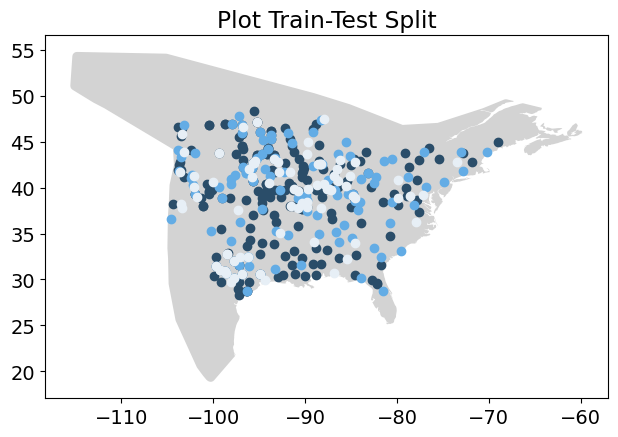

In [ ]:
f, ax = plt.subplots()
studyareashp.plot(ax=ax, color='lightgrey')
X_train.plot(ax=ax, facecolor='#2a4d69') #dark blue
X_val.plot(ax=ax, facecolor='#63ace5') #medium blue
X_test.plot(ax=ax, facecolor='#e7eff6') #light blue
plt.title("Plot Train-Test Split")
plt.tight_layout()

In [9]:
X_train_nopoint = X_train[pred_variables]
X_val_nopoint = X_val[pred_variables]
X_trainval_nopoint = X_train_val[pred_variables]
X_test_nopoint = X_test[pred_variables]

# Data Explore

## Pair Plots

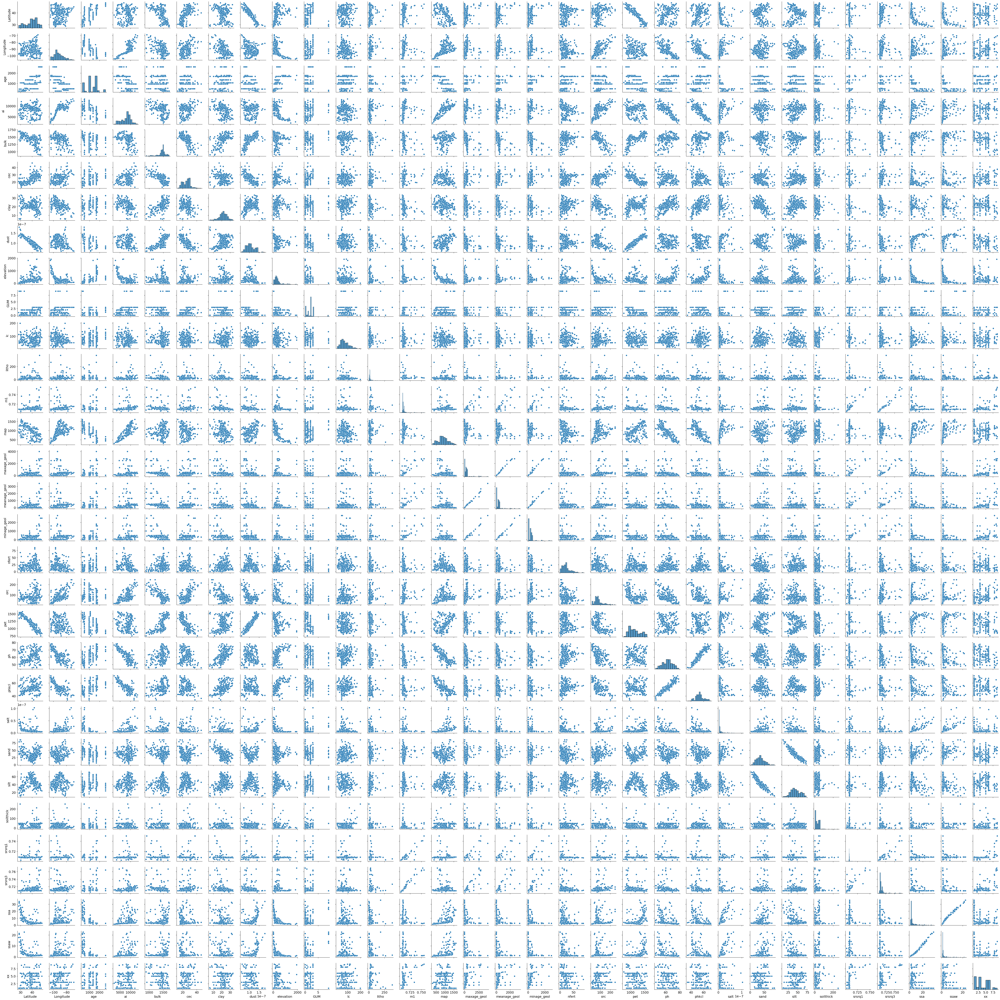

In [ ]:
sns.pairplot(X_train_val,
             x_vars=pred_variables,
             y_vars=pred_variables,
             height=2,
             aspect=1.0)
plt.show()

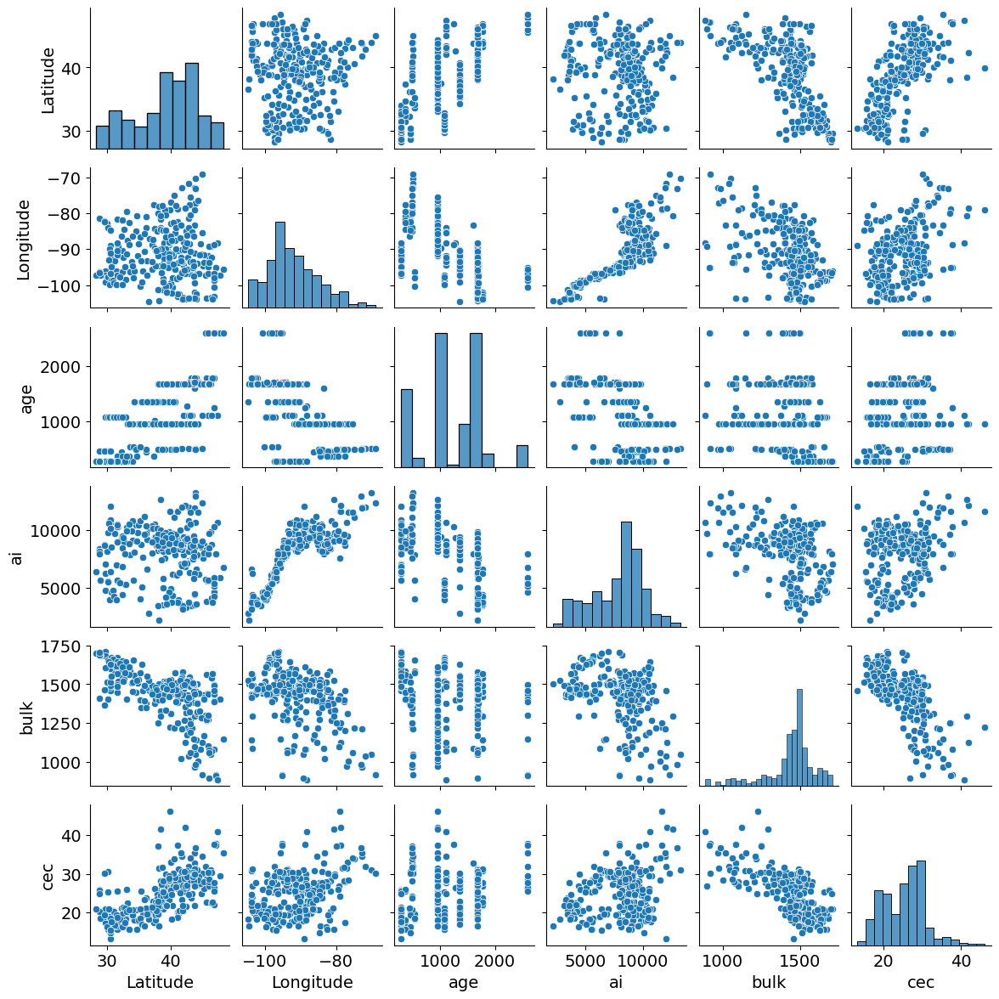

In [11]:
sns.pairplot(X_train_val,
             x_vars=['Latitude', 'Longitude', "age","ai","bulk","cec"],
             y_vars=['Latitude', 'Longitude', "age","ai","bulk","cec"],
             height=2,
             aspect=1.0)
plt.show()

## Correlation with strontium

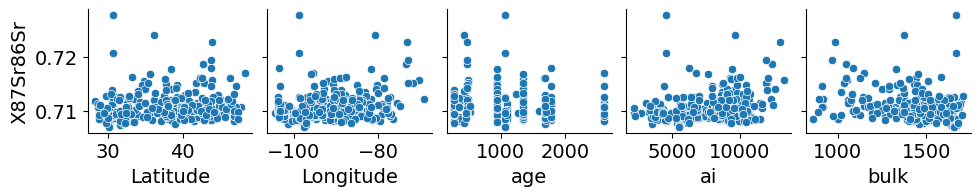

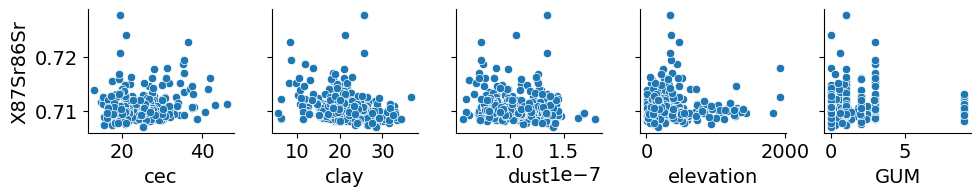

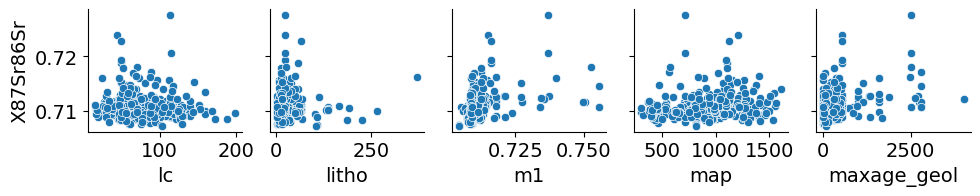

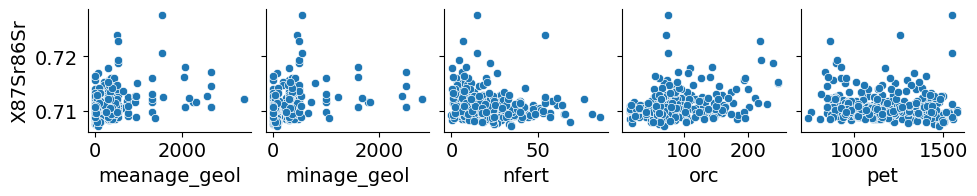

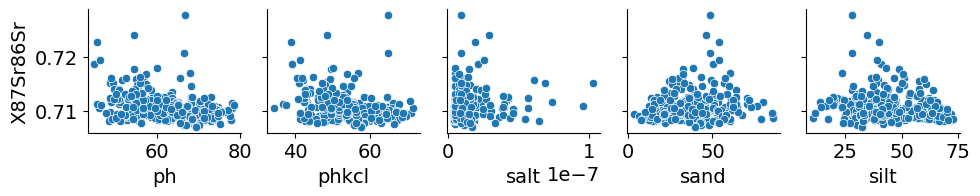

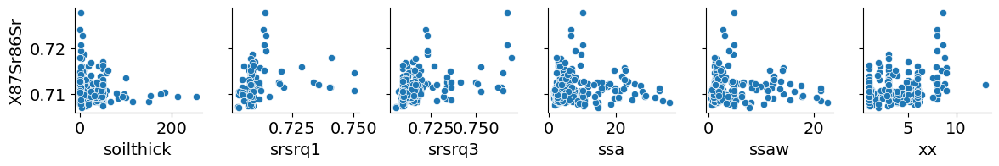

In [ ]:
sns.pairplot(plant_data,
             x_vars=['Latitude', 'Longitude', "age","ai","bulk"],
             y_vars="X87Sr86Sr",
             height=2,
             aspect=1)
sns.pairplot(plant_data,
             x_vars=["cec","clay","dust","elevation","GUM"],
             y_vars="X87Sr86Sr",
             height=2,
             aspect=1)
sns.pairplot(plant_data,
             x_vars=["lc","litho","m1","map","maxage_geol"],
             y_vars="X87Sr86Sr",
             height=2,
             aspect=1)
sns.pairplot(plant_data,
             x_vars=["meanage_geol","minage_geol","nfert","orc","pet"],
             y_vars="X87Sr86Sr",
             height=2,
             aspect=1)
sns.pairplot(plant_data,
             x_vars=["ph","phkcl","salt","sand","silt"],
             y_vars="X87Sr86Sr",
             height=2,
             aspect=1)
sns.pairplot(plant_data,
             x_vars=["soilthick","srsrq1","srsrq3","ssa","ssaw","xx"],
             y_vars="X87Sr86Sr",
             height=2,
             aspect=1)
plt.show()

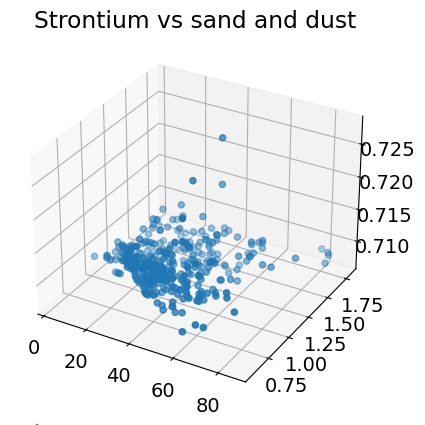

In [ ]:
fig = plt.figure()

ax = plt.axes(projection ='3d')

z = plant_data["X87Sr86Sr"]
x = plant_data["sand"]
y = plant_data["dust"]

ax.scatter(x, y, z)
ax.set_title('Strontium vs sand and dust')
plt.show()

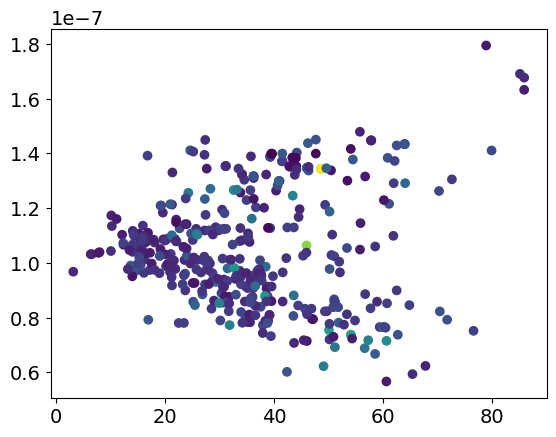

In [12]:
fig = plt.figure()

z = plant_data["X87Sr86Sr"]
x = plant_data["sand"]
y = plant_data["dust"]

plt.scatter(x, y, c=z)
ax.set_title('Strontium vs sand and dust')
plt.show()

# Linear Regression (baseline)

In [ ]:
linreg = LinearRegression()
linreg.fit(X_train_nopoint, y_train)
print('training R-squared:', np.round(r2_score(y_train, linreg.predict(X_train_nopoint)),4))

scores_reg = cross_val_score(linreg, X_trainval_nopoint, y_train_val, cv=10, scoring='r2')

print("validation R-squared:", np.round(scores_reg,4))
print("average over folds:", np.round(np.mean(scores_reg),4))
print("min/max over folds: [", np.round(np.min(scores_reg),4),',',np.round(np.max(scores_reg),4),']')

training R-squared: 0.445
validation R-squared: [ 4.01500000e-01  1.55400000e-01 -7.43000000e-02  1.09400000e-01
 -2.06000000e-02  1.41900000e-01  3.23900000e-01  8.40000000e-03
 -2.28688048e+05 -2.77390000e+00]
average over folds: -22868.9776
min/max over folds: [ -228688.0479 , 0.4015 ]


In [ ]:
print('LR coefficients:')
for i, coeff in enumerate(linreg.coef_):
  print('{0:5s}  {1:>-10.2f}'.format(pred_variables[i], coeff))

LR coefficients:
Latitude       -0.00
Longitude       -0.00
age          0.00
ai           0.00
bulk        -0.00
cec         -0.00
clay        -0.00
dust    -83075.63
elevation        0.00
GUM          0.00
lc          -0.00
litho        0.00
m1          -0.24
map          0.00
maxage_geol       -1.52
meanage_geol        3.04
minage_geol       -1.52
nfert       -0.00
orc          0.00
pet          0.00
ph          -0.00
phkcl       -0.00
salt     52171.19
sand        -0.00
silt        -0.00
soilthick        0.00
srsrq1        0.09
srsrq3        0.12
ssa         -0.00
ssaw         0.00
xx          -0.00


## Ridge Regularization

In [ ]:
n_fold = 10
alphas = np.logspace(-5, 5, 51)
coeffs = np.zeros((len(alphas), X_train_nopoint.shape[1]))
cv_scores = np.zeros((len(alphas), n_fold))

for i, alpha in enumerate(alphas):
  ridge = Ridge(alpha).fit(X_train_nopoint, y_train)
  coeffs[i,:] = ridge.coef_
  cv_scores[i,:] = cross_val_score(ridge, X_train_nopoint, y_train, cv=n_fold, scoring='r2')

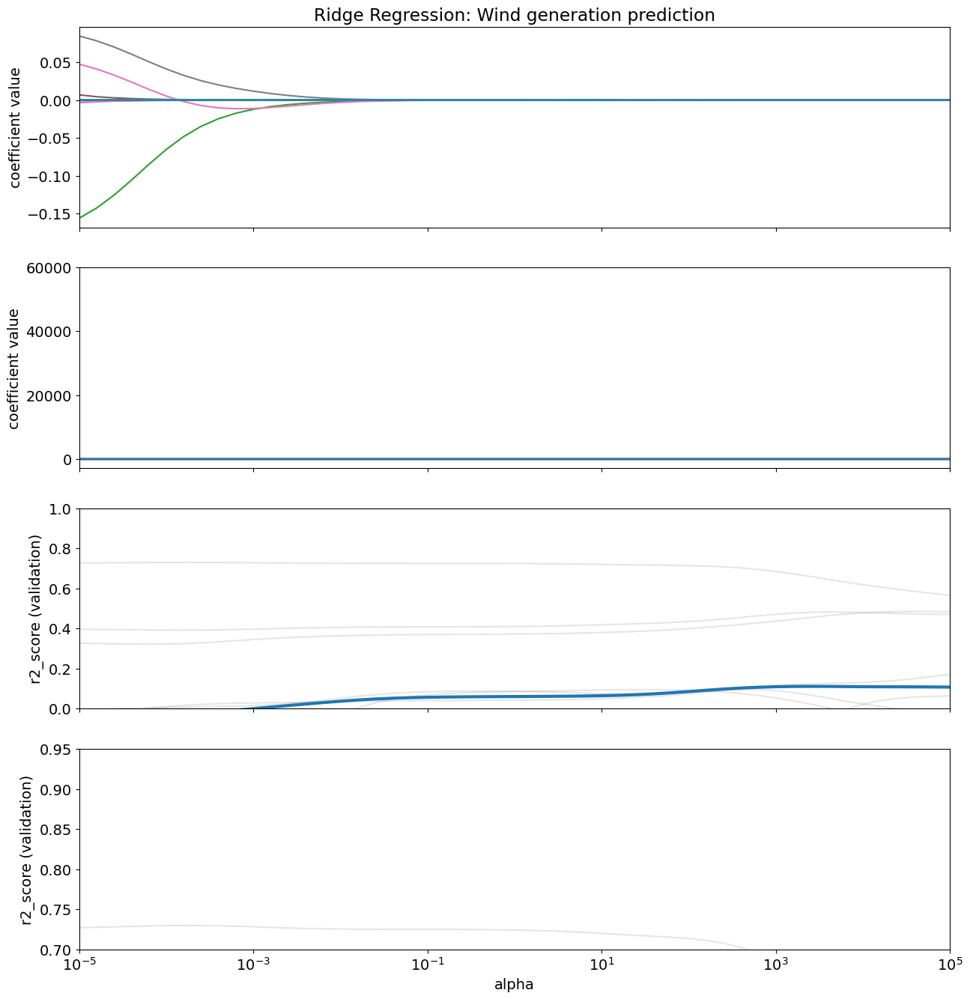

In [ ]:
fig, ax = plt.subplots(4,1,figsize=(15,16), sharex=True)
ax[0].plot(alphas, coeffs)
ax[0].set_xticks(alphas)
ax[0].set_ylabel('coefficient value')
ax[0].set_title('Ridge Regression: Wind generation prediction')
ax[1].plot(alphas, coeffs)
ax[1].set_ylabel('coefficient value')
ax[1].set_ylim([-2850, 60000])
ax[1].set_xlim([alphas[0], alphas[-1]])
ax[2].plot(alphas, cv_scores, color='k', alpha=0.1)
ax[2].plot(alphas, np.mean(cv_scores, axis=1), linewidth=3)
ax[2].set_ylabel('r2_score (validation)')
ax[2].set_ylim([0.0,1.0])
ax[3].plot(alphas, cv_scores, color='k', alpha=0.1)
ax[3].plot(alphas, np.mean(cv_scores, axis=1), linewidth=3)
ax[3].set_xscale('log')
ax[3].set_ylabel('r2_score (validation)')
ax[3].set_xlabel('alpha')
ax[3].set_ylim([0.7,0.95])
plt.show()

In [ ]:
ridge = Ridge(0.0001).fit(X_trainval_nopoint, y_train_val)
print('training R-squared:', np.round(r2_score(y_train_val, ridge.predict(X_trainval_nopoint)),4))

scores_reg = cross_val_score(ridge, X_trainval_nopoint, y_train_val, cv=10, scoring='r2')

print("validation R-squared:", np.round(scores_reg,4))
print("average over folds:", np.round(np.mean(scores_reg),4))
print("min/max over folds: [", np.round(np.min(scores_reg),4),',',np.round(np.max(scores_reg),4),']')

training R-squared: 0.3379
validation R-squared: [ 0.3346  0.1127 -0.0754  0.198   0.088   0.0621  0.408  -0.2383  0.2898
 -2.469 ]
average over folds: -0.129
min/max over folds: [ -2.469 , 0.408 ]


In [ ]:
print('LR coefficients:')
for i, coeff in enumerate(ridge.coef_):
  print('{0:5s}  {1:>-10.2f}'.format(pred_variables[i], coeff))

LR coefficients:
Latitude        0.00
Longitude        0.00
age         -0.00
ai           0.00
bulk         0.00
cec         -0.00
clay        -0.00
dust        -0.00
elevation        0.00
GUM          0.00
lc           0.00
litho       -0.00
m1          -0.16
map         -0.00
maxage_geol       -0.00
meanage_geol        0.00
minage_geol       -0.00
nfert       -0.00
orc          0.00
pet          0.00
ph          -0.00
phkcl       -0.00
salt         0.00
sand        -0.00
silt        -0.00
soilthick        0.00
srsrq1        0.07
srsrq3        0.10
ssa          0.00
ssaw        -0.00
xx           0.00


## Lasso Regularization

In [ ]:
n_fold = 10
alphas = np.logspace(0, 4, 41)
coeffs = np.zeros((len(alphas), X_train_nopoint.shape[1]))
cv_scores = np.zeros((len(alphas), n_fold))

for i, alpha in enumerate(alphas):
  lasso = Lasso(alpha, random_state=2023, max_iter=50000).fit(X_train_nopoint, y_train)
  #ridge = Ridge(alpha).fit(X_train_nopoint, y_train)
  coeffs[i,:] = lasso.coef_
  cv_scores[i,:] = cross_val_score(lasso, X_train_nopoint, y_train, cv=n_fold, scoring='neg_root_mean_squared_error')

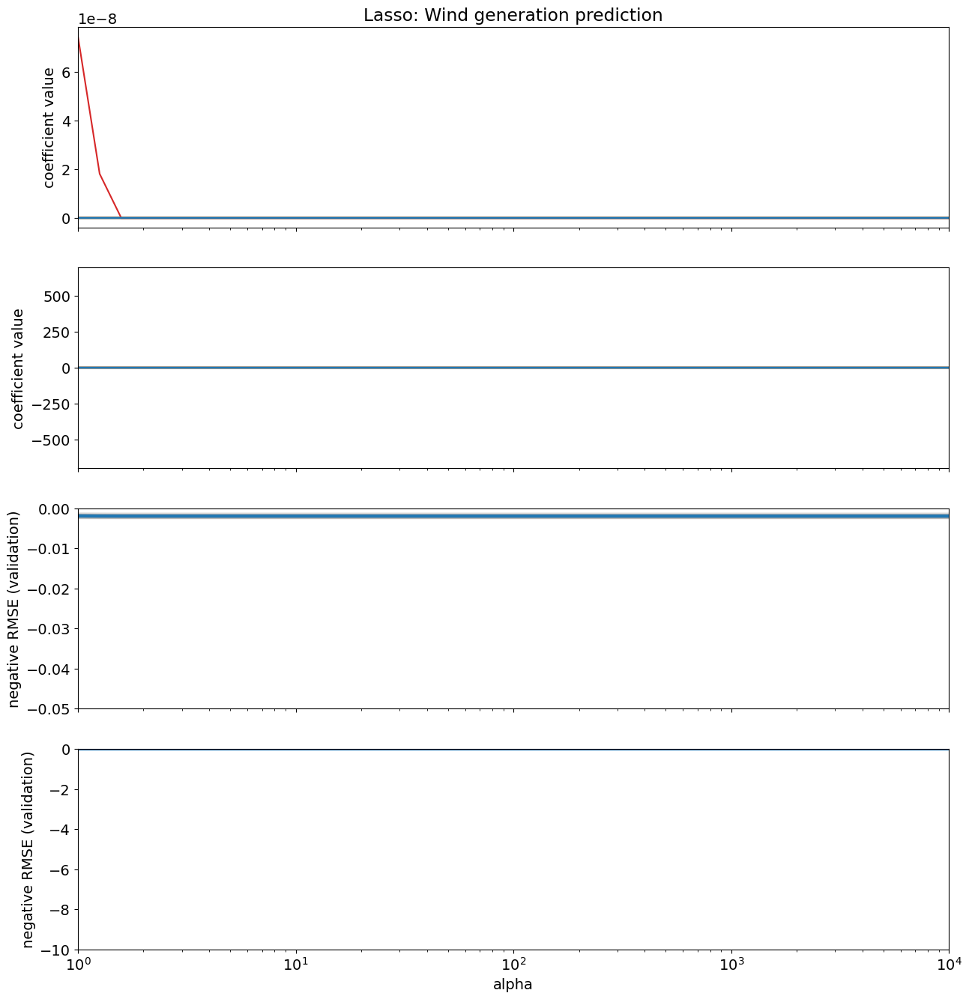

In [ ]:
fig, ax = plt.subplots(4,1,figsize=(15,16), sharex=True)
ax[0].plot(alphas, coeffs)
ax[0].set_xticks(alphas)
ax[0].set_ylabel('coefficient value')
ax[0].set_title('Lasso: Wind generation prediction')
ax[1].plot(alphas, coeffs)
ax[1].set_ylabel('coefficient value')
ax[1].set_ylim([-700, 700])
ax[1].set_xlim([alphas[0], alphas[-1]])
ax[2].plot(alphas, cv_scores, color='k', alpha=0.1)
ax[2].plot(alphas, np.mean(cv_scores, axis=1), linewidth=3)
ax[2].set_ylabel('negative RMSE (validation)')
ax[2].set_ylim([-0.05,0])
ax[3].plot(alphas, cv_scores, color='k', alpha=0.1)
ax[3].plot(alphas, np.mean(cv_scores, axis=1), linewidth=3)
ax[3].set_xscale('log')
ax[3].set_ylabel('negative RMSE (validation)')
ax[3].set_xlabel('alpha')
ax[3].set_ylim([-10,0])
plt.show()

In [ ]:
lasso = Lasso(alpha, random_state=2023, max_iter=50000).fit(X_train_nopoint, y_train)
print('training R-squared:', np.round(r2_score(y_train, lasso.predict(X_train_nopoint)),4))

scores_reg = cross_val_score(lasso, X_train_nopoint, y_train, cv=10, scoring='r2')

print("validation R-squared:", np.round(scores_reg,4))
print("average over folds:", np.round(np.mean(scores_reg),4))
print("min/max over folds: [", np.round(np.min(scores_reg),4),',',np.round(np.max(scores_reg),4),']')

training R-squared: 0.0
validation R-squared: [-0.0046 -0.1432 -0.0089 -0.0032 -0.1547 -0.057  -0.006  -0.001  -0.0186
 -0.0365]
average over folds: -0.0434
min/max over folds: [ -0.1547 , -0.001 ]


In [ ]:
print('LR coefficients:')
for i, coeff in enumerate(lasso.coef_):
  print('{0:5s}  {1:>-10.2f}'.format(pred_variables[i], coeff))

LR coefficients:
Latitude        0.00
Longitude        0.00
age         -0.00
ai           0.00
bulk        -0.00
cec          0.00
clay        -0.00
dust        -0.00
elevation        0.00
GUM          0.00
lc          -0.00
litho        0.00
m1           0.00
map          0.00
maxage_geol        0.00
meanage_geol        0.00
minage_geol        0.00
nfert       -0.00
orc          0.00
pet         -0.00
ph          -0.00
phkcl       -0.00
salt         0.00
sand         0.00
silt        -0.00
soilthick       -0.00
srsrq1        0.00
srsrq3        0.00
ssa          0.00
ssaw         0.00
xx           0.00


# Decision Tree

In [ ]:
nfolds = 6
depths = np.arange(1,21,1)
val_scores = np.zeros((depths.shape[0], nfolds))

for i, d in enumerate(depths):
  tree = DecisionTreeRegressor(max_depth=d, random_state=2023)
  val_scores[i,:] = cross_val_score(tree, X_trainval_nopoint, y_train_val, cv=nfolds, scoring='r2')

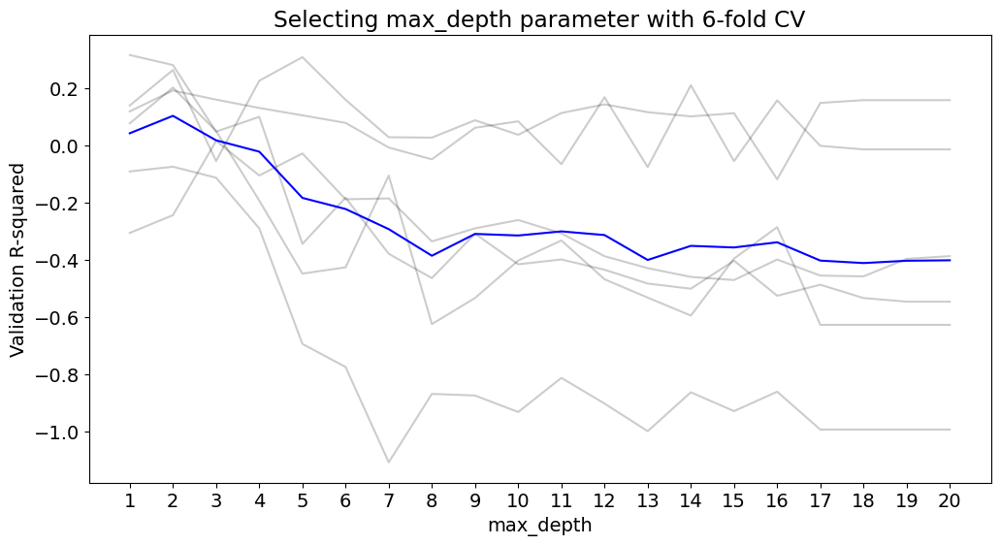

[ 0.0428  0.1037  0.0181 -0.0215 -0.1832 -0.2221 -0.2925 -0.3855 -0.3092
 -0.3147 -0.3004 -0.3132 -0.4003 -0.351  -0.3566 -0.3385 -0.4025 -0.4111
 -0.403  -0.4015]


In [ ]:
plt.figure(figsize=(12,6))
plt.plot(depths, val_scores, color='k', alpha=0.2)
plt.plot(depths, np.mean(val_scores,axis=1), color='blue')
plt.title('Selecting max_depth parameter with 6-fold CV')
plt.xlabel('max_depth')
plt.ylabel('Validation R-squared')
plt.xticks(depths)
plt.show()

print(np.round(np.mean(val_scores,axis=1),4))

In [ ]:
my_depth = 2
tree = DecisionTreeRegressor(max_depth=my_depth, random_state=2023)
tree.fit(X_trainval_nopoint, y_train_val)

print('Decison Tree validation R2 score:', np.round(np.mean(val_scores[depths==my_depth,:]), 4))

Decison Tree validation R2 score: 0.1037


In [ ]:
text_representation = export_text(tree, feature_names=pred_variables)
print(text_representation)

|--- srsrq1 <= 0.71
|   |--- ph <= 59.52
|   |   |--- value: [0.71]
|   |--- ph >  59.52
|   |   |--- value: [0.71]
|--- srsrq1 >  0.71
|   |--- clay <= 20.60
|   |   |--- value: [0.71]
|   |--- clay >  20.60
|   |   |--- value: [0.72]



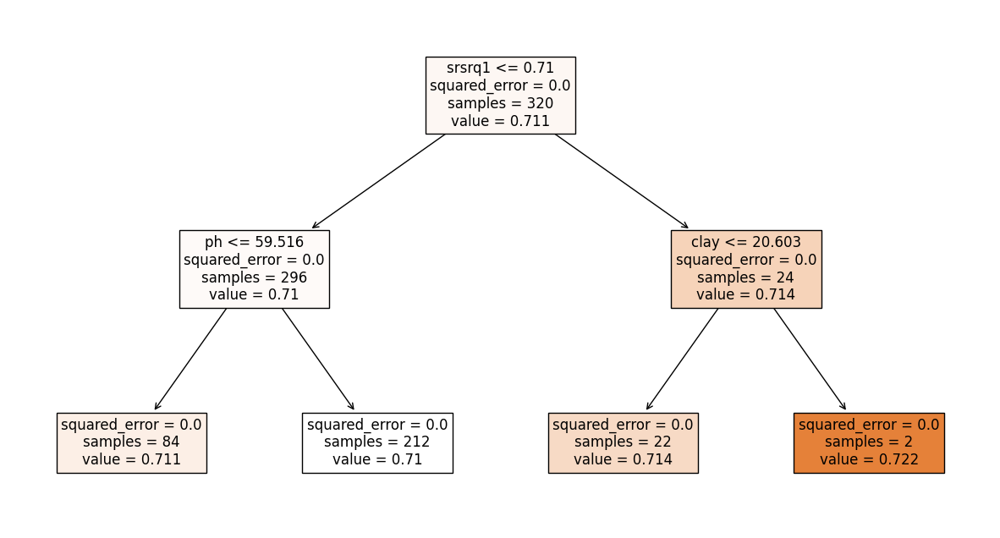

In [ ]:
fig = plt.figure(figsize=(15,8))
_ = plot_tree(tree, feature_names=pred_variables, filled=True, fontsize=12)
plt.show()

# Random Forest

In [15]:
base_rf = RandomForestRegressor(n_estimators=200, max_features="sqrt", oob_score=True, random_state=2023)
base_rf.fit(X_trainval_nopoint, y_train_val)

base_rf_val_score = base_rf.score(X_trainval_nopoint, y_train_val)

print('Random forest R2 Score:', np.round(base_rf_val_score,4))

Random forest R2 Score: 0.9106


In [ ]:
for i, var in enumerate(pred_variables):
  print('{0:5s}  {1:>-10.4f}'.format(var, base_rf.feature_importances_[i]))

Latitude      0.0215
Longitude      0.0450
age        0.0199
ai         0.0473
bulk       0.0332
cec        0.0291
clay       0.0363
dust       0.0000
elevation      0.0275
GUM        0.0112
lc         0.0194
litho      0.0196
m1         0.0807
map        0.0351
maxage_geol      0.0370
meanage_geol      0.0297
minage_geol      0.0245
nfert      0.0532
orc        0.0364
pet        0.0265
ph         0.0448
phkcl      0.0482
salt       0.0000
sand       0.0218
silt       0.0221
soilthick      0.0327
srsrq1      0.0587
srsrq3      0.0492
ssa        0.0258
ssaw       0.0260
xx         0.0374


In [ ]:
prediction = base_rf.predict(X_trainval_nopoint)

mse = mean_squared_error(y_train_val, prediction)
rmse = mse**.5

print(mse)
print(rmse)

4.430955472023568e-07
0.0006656542249564385


In [ ]:
stan_dev = y_train_val.std()
stan_dev

0.0022259506255755076

In [ ]:
rmse/stan_dev

0.299042672963304

## Plotting Residuals

In [25]:
y_pred = base_rf.predict(X_train_nopoint)

rf_residuals = y_train - y_pred

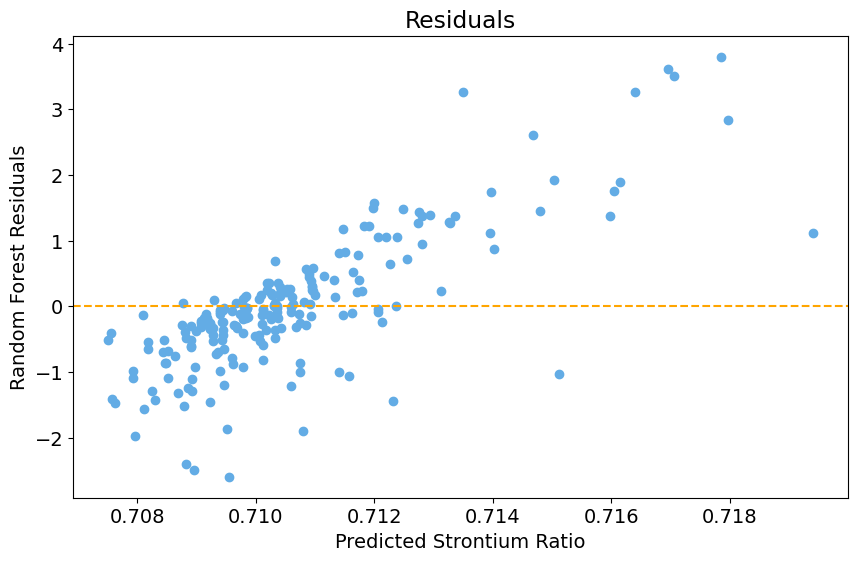

In [27]:
rf_residuals = (rf_residuals - np.mean(rf_residuals)) / np.std(rf_residuals)
plt.figure(figsize=(10, 6))
plt.scatter(y_train, rf_residuals, color='#63ace5')
plt.axhline(y=0, color='orange', linestyle='--')
plt.xlabel('Predicted Strontium Ratio')
plt.ylabel('Random Forest Residuals')
plt.title('Residuals')
plt.show()

**On TEST DATA (post-project)**

In [28]:
y_pred_test = base_rf.predict(X_test_nopoint)

rf_residuals = y_test - y_pred_test

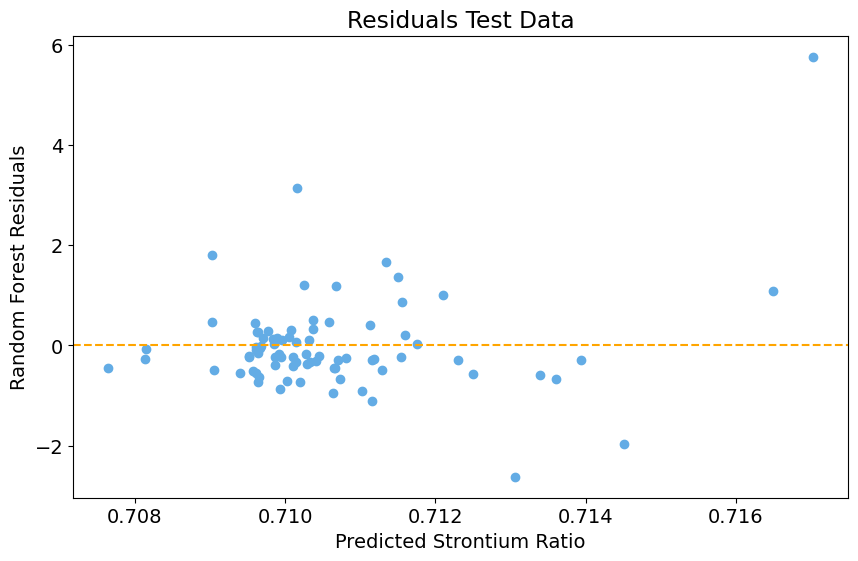

In [29]:
rf_residuals = (rf_residuals - np.mean(rf_residuals)) / np.std(rf_residuals)
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_test, rf_residuals, color='#63ace5')
plt.axhline(y=0, color='orange', linestyle='--')
plt.xlabel('Predicted Strontium Ratio')
plt.ylabel('Random Forest Residuals')
plt.title('Residuals Test Data')
plt.show()

## Cross Validate

In [ ]:
rf = RandomForestRegressor(n_estimators=200, max_features="sqrt", oob_score=True, random_state=2023)
val_scores = cross_val_score(rf, X_trainval_nopoint, y_train_val, cv=10)

In [ ]:
np.mean(val_scores)

0.34781223860029564

In [ ]:
rf.fit(X_trainval_nopoint, y_train_val)
rf.oob_score_

0.35352680542750103

# K Neighbors

In [ ]:
neigh = KNeighborsRegressor(n_neighbors=2)
neigh.fit(X_train_nopoint, y_train)

KNeighborsRegressor(n_neighbors=2)

In [ ]:
neigh_score = neigh.score(X_val_nopoint, y_val)
print('KN Regression R2 Score:', np.round(neigh_score,4))

prediction = neigh.predict(X_val_nopoint)
mse = mean_squared_error(y_val, prediction)
rmse = mse**.5
print('RMSE: ', rmse)

print('RMSE/std: ', rmse/stan_dev)

KN Regression R2 Score: 0.1366
RMSE:  0.0024026686389897823
RMSE/std:  1.079389907118261


## Optimize

In [ ]:
nfolds = 10
K_max  = 30
val_score = np.zeros((K_max, nfolds))

for k in range(1, K_max+1):
  knn = KNeighborsRegressor(k)
  val_score[k-1,:] = cross_val_score(knn, X_trainval_nopoint, y_train_val, cv=nfolds)

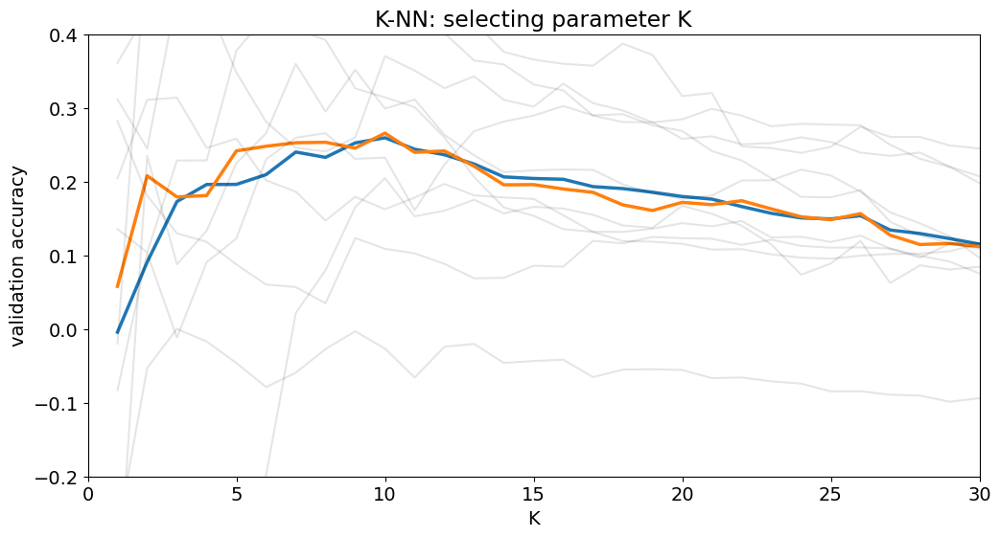

[-0.004  0.091  0.173  0.196  0.196  0.209  0.24   0.233  0.253  0.259
  0.244  0.236  0.224  0.206  0.204  0.203  0.193  0.191  0.186  0.18
  0.176  0.166  0.157  0.151  0.149  0.154  0.134  0.13   0.123  0.115]


In [ ]:
plt.figure(figsize=(12,6))
plt.plot(np.arange(1,K_max+1), np.mean(val_score,axis=1), linewidth=2.5)
plt.plot(np.arange(1,K_max+1), np.median(val_score,axis=1), linewidth=2.5)
plt.plot(np.arange(1,K_max+1), val_score, color='black', alpha=0.1)

plt.title('K-NN: selecting parameter K')
plt.xlabel('K')
plt.ylabel('validation accuracy')
plt.xlim([0,K_max])
plt.ylim([-0.2, 0.4])
plt.show()

print(np.round(np.mean(val_score,axis=1),3))

In [ ]:
my_K = 10
knn_val_score = np.mean(val_score[my_K-1,:])

print('K:', my_K)
print('KNN validation accuracy:', np.round(knn_val_score,4))

## fit classifier with selected hyperparameter values K ##
knn = KNeighborsRegressor(n_neighbors=my_K)
knn.fit(X_trainval_nopoint, y_train_val)

K: 10
KNN validation accuracy: 0.2594


KNeighborsRegressor(n_neighbors=10)

In [ ]:
knn_score = knn.score(X_val_nopoint, y_val)
print('KN Regression R2 Score:', np.round(knn_score,4))

prediction = knn.predict(X_val_nopoint)
mse = mean_squared_error(y_val, prediction)
rmse = mse**.5
print('RMSE: ', rmse)

print('RMSE/std: ', rmse/stan_dev)

KN Regression R2 Score: 0.3321
RMSE:  0.0021131776245496173
RMSE/std:  0.9493371507300467


# PCA + Standardization

In [53]:
scaler = StandardScaler()

scaler.fit(X_train_nopoint)

Xstan_train = scaler.transform(X_train_nopoint)
Xstan_val   = scaler.transform(X_val_nopoint)
Xstan_trainval   = scaler.transform(X_trainval_nopoint)
Xstan_test  = scaler.transform(X_test_nopoint)

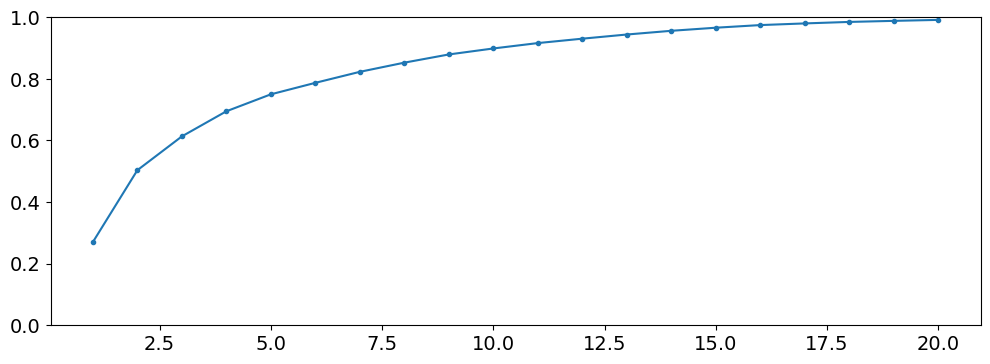

[0.2701 0.5035 0.6133 0.6948 0.7499 0.7872 0.8229 0.8527 0.8793 0.8988
 0.9162 0.9305 0.944  0.9561 0.9661 0.9747 0.9801 0.9849 0.9884 0.9915]


In [ ]:
pca_stan = PCA(n_components=20, random_state=2023)
pca_stan.fit(Xstan_train)

plt.figure(figsize=(12,4))
plt.plot(np.arange(1,21), np.cumsum(pca_stan.explained_variance_ratio_), marker='.')
plt.ylim([0,1])
plt.show()

print(np.round( np.cumsum(pca_stan.explained_variance_ratio_[0:20]), 4))

In [54]:
n_components = 13
pca = PCA(n_components=n_components)
pca.fit(X_train_nopoint)

Xpca_train = pca.transform(Xstan_train)
Xpca_val   = pca.transform(Xstan_val)
Xpca_trainval = pca.transform(Xstan_trainval)
Xpca_test  = pca.transform(Xstan_test)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


## Lin Reg + PCA

In [ ]:
pca_linreg = LinearRegression()
pca_linreg.fit(Xpca_trainval, y_train_val)
print('training R-squared:', np.round(r2_score(y_train_val, pca_linreg.predict(Xpca_trainval)),4))

scores_reg = cross_val_score(pca_linreg, Xpca_trainval, y_train_val, cv=10, scoring='r2')

print("validation R-squared:", np.round(scores_reg,4))
print("average over folds:", np.round(np.mean(scores_reg),4))
print("min/max over folds: [", np.round(np.min(scores_reg),4),',',np.round(np.max(scores_reg),4),']')

training R-squared: 0.2946
validation R-squared: [ 0.3057  0.158   0.0068  0.2378  0.0145  0.0877  0.4297  0.0717  0.2755
 -0.3985]
average over folds: 0.1189
min/max over folds: [ -0.3985 , 0.4297 ]


In [ ]:
prediction = pca_linreg.predict(Xpca_trainval)
mse = mean_squared_error(y_train_val, prediction)
rmse = mse**.5
print('RMSE: ', rmse)

print('RMSE/std: ', rmse/stan_dev)

RMSE:  0.0018694949584769156
RMSE/std:  0.8398636236567771


## Random Forest + PCA

In [ ]:
pca_rf = RandomForestRegressor(n_estimators=200, max_features="sqrt", oob_score=True, random_state=2023)
pca_rf.fit(Xpca_trainval, y_train_val)

pca_rf_val_score = pca_rf.score(Xpca_trainval, y_train_val)

print('Random forest R2 Score:', np.round(pca_rf_val_score,4))

Random forest R2 Score: 0.8955


## Standardization + RF

In [59]:
scaler = StandardScaler()

scaler.fit(X_train_nopoint)

Xstan_train = scaler.transform(X_train_nopoint)
Xstan_val   = scaler.transform(X_val_nopoint)
Xstan_trainval   = scaler.transform(X_trainval_nopoint)
Xstan_test  = scaler.transform(X_test_nopoint)

In [60]:
stan_rf = RandomForestRegressor(n_estimators=200, max_features="sqrt", oob_score=True, random_state=2023)
stan_rf.fit(Xstan_trainval, y_train_val)

stan_rf_val_score = stan_rf.score(Xstan_trainval, y_train_val)

print('Random forest R2 Score:', np.round(stan_rf_val_score,4))

Random forest R2 Score: 0.9117


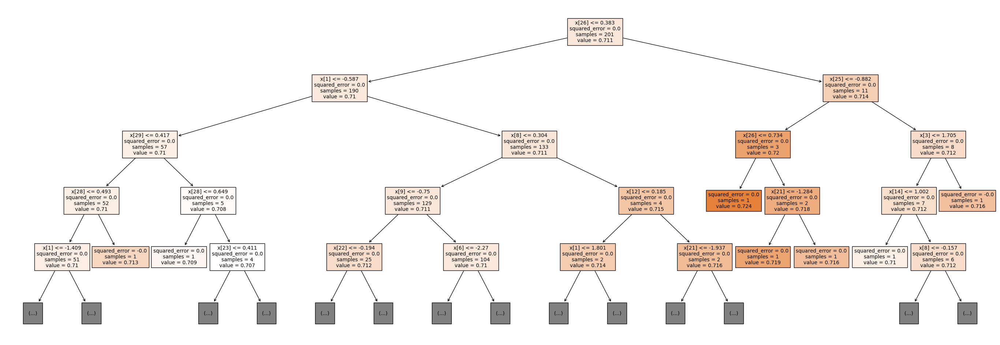

In [ ]:
plt.figure(figsize=(35,12))
_ = plot_tree(stan_rf.estimators_[3], filled=True, max_depth=4, fontsize=10)

### Learning curve

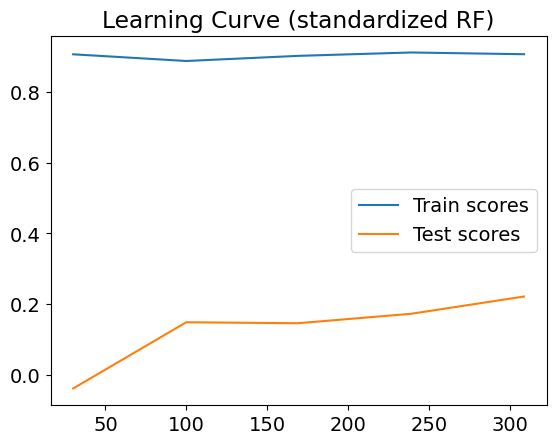

In [ ]:
line1, = plt.plot(train_sizes,np.mean(train_scores,axis=1), label='Train scores')
line2, = plt.plot(train_sizes,np.mean(test_scores,axis=1), label='Test scores')
leg = plt.legend(loc='center right')
plt.title("Learning Curve (standardized RF)")
plt.show()

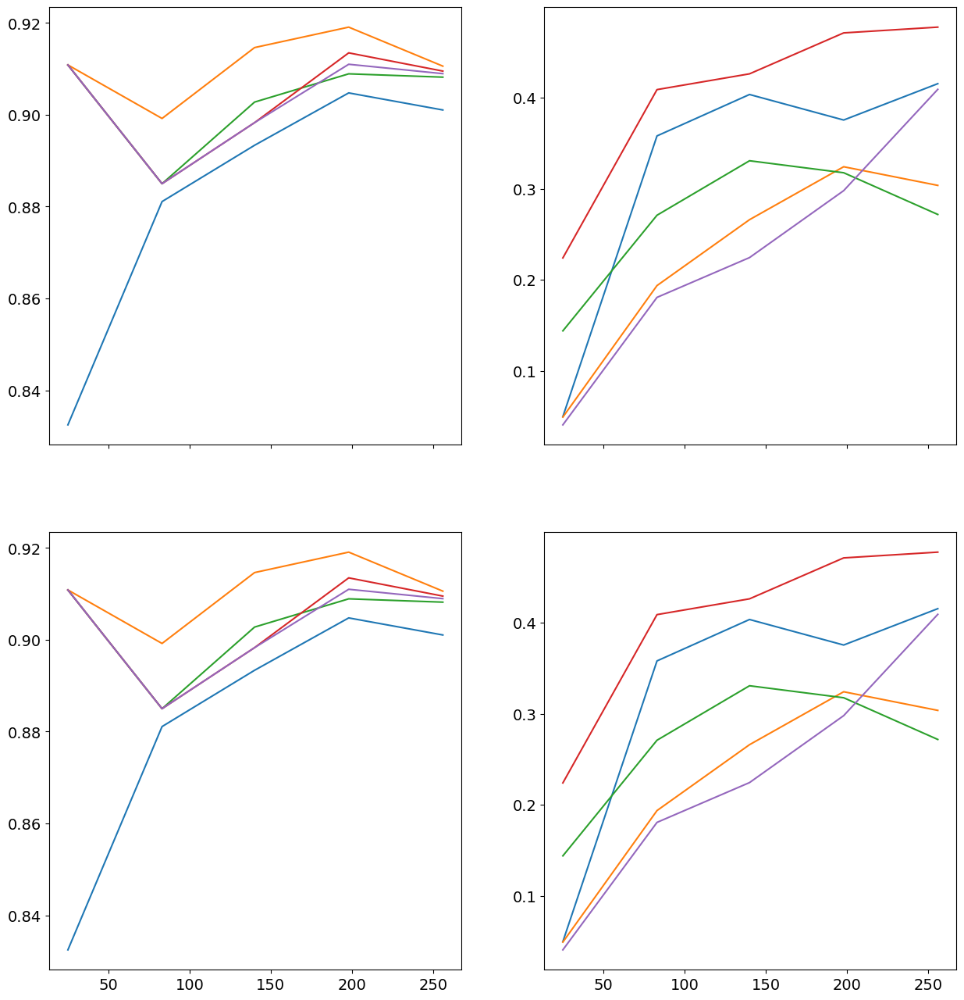

In [ ]:
fig, axes = plt.subplots(2,2,figsize=(15,16), sharex=True)
train_sizes, train_scores, valid_scores =learning_curve(stan_rf,Xstan_trainval,y_train_val)
axes[0,0].plot(train_sizes,train_scores)
axes[0,1].plot(train_sizes,valid_scores)

train_sizes, train_scores, valid_scores =learning_curve(stan_rf, Xstan_trainval,y_train_val)
axes[1,0].plot(train_sizes,train_scores)
axes[1,1].plot(train_sizes,valid_scores)
plt.show()

### Plotting Residuals

In [ ]:
stan_rf = RandomForestRegressor(n_estimators=200, max_features="sqrt", oob_score=True, random_state=2023)
stan_rf.fit(Xstan_trainval, y_train_val)

y_pred = stan_rf.predict(Xstan_trainval)

residuals = y_train_val - y_pred

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, y_train_val, color='#63ace5')
plt.plot([y_train_val.min(), y_train_val.max()], [y_train_val.min(), y_train_val.max()], 'k--', lw=3, color='orange')
plt.xlabel('Predicted Strontium Ratio')
plt.ylabel('Actual Strontium Ratio')
plt.title('Predicted vs Actual')
plt.show()

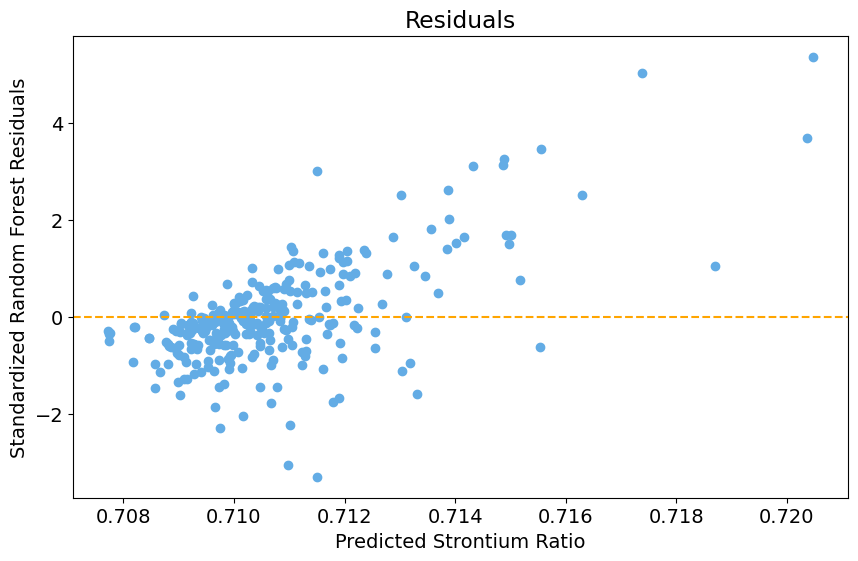

In [ ]:
standardized_residuals = (residuals - np.mean(residuals)) / np.std(residuals)
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, standardized_residuals, color='#63ace5')
plt.axhline(y=0, color='orange', linestyle='--')
plt.xlabel('Predicted Strontium Ratio')
plt.ylabel('Standardized Random Forest Residuals')
plt.title('Residuals')
plt.show()

In [ ]:
rf = RandomForestRegressor(n_estimators=200, max_features="sqrt", random_state=2023)

X_trainval_stan = scaler.transform(X_trainval_nopoint)

cv_scores = cross_val_score(rf, X_trainval_stan, y_train_val, cv=5)

print("CV Scores:", cv_scores)

print("Mean CV Score:", np.mean(cv_scores))
print("Standard Deviation of CV Scores:", np.std(cv_scores))


CV Scores: [0.41537135 0.30365006 0.27172007 0.47745434 0.40915403]
Mean CV Score: 0.3754699702344498
Standard Deviation of CV Scores: 0.07622294698313255


**On TEST DATA (post-project)**

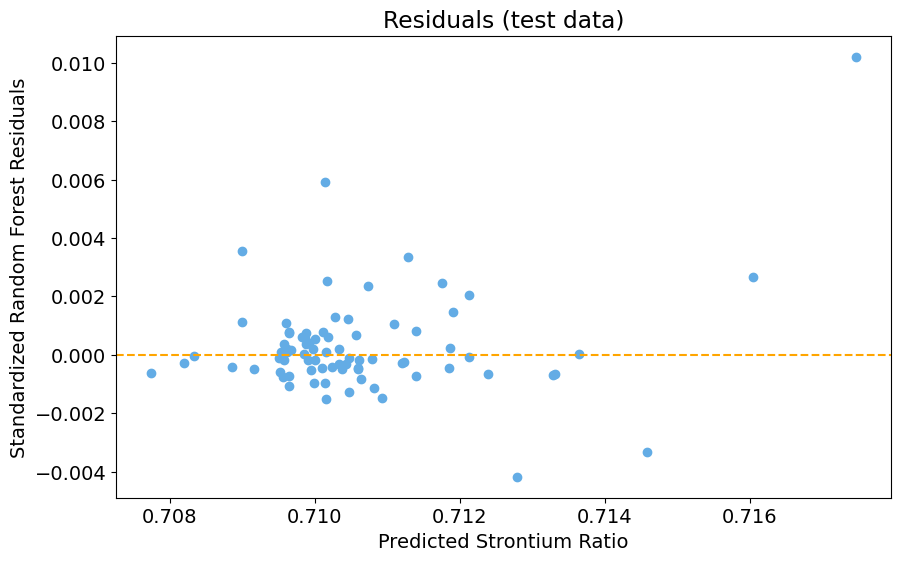

In [ ]:
y_pred_test = stan_rf.predict(Xstan_test)

residuals_test = y_test - y_pred_test

plt.figure(figsize=(10, 6))
plt.scatter(y_pred_test, residuals_test, color='#63ace5')
plt.axhline(y=0, color='orange', linestyle='--')
plt.xlabel('Predicted Strontium Ratio')
plt.ylabel('Standardized Random Forest Residuals')
plt.title('Residuals (test data)')
plt.show()

# Plotting the Isoscape

In [30]:
multipol = studyareashp.geometry[0]

multipol = [list(x.exterior.coords) for x in multipol.geoms][0]

print(multipol)
print(len(multipol))

[(-99.91129501919971, 19.03353018896527), (-100.03784142831381, 18.92824074448232), (-100.19172168617582, 18.869753762858014), (-100.35625525852684, 18.86440920033001), (-100.51360679774999, 18.912786404500043), (-100.59360679774998, 18.952786404500042), (-100.75548087581355, 19.081559276501856), (-101.13548087581354, 19.541559276501857), (-101.15177859667237, 19.562386224687135), (-101.75177859667237, 20.372386224687137), (-101.80508986745996, 20.46289323397032), (-104.08508986745996, 25.472893233970318), (-104.12114711025549, 25.58632761299251), (-104.8611471102555, 29.466327612992508), (-104.86988189441196, 29.54913300229539), (-104.9296514990654, 32.29853481635356), (-104.99897212032843, 33.37795591887799), (-104.99994530150886, 33.41739564055486), (-104.94994530150886, 36.79739564055486), (-104.94890875157878, 36.82301602032506), (-104.85928577564152, 38.17731876782133), (-104.76953259962433, 40.251614391329895), (-104.75840632070974, 40.3370479607035), (-104.29292636920783, 42.46

In [31]:
p = Path(multipol)

x, y = np.meshgrid(np.arange(-120, -55, 0.1), np.arange(15, 55, 0.1))
x, y = x.flatten(), y.flatten()
points = np.vstack((x,y)).T

grid = p.contains_points(points)

true_points = []

for i in range(len(grid)):
  if grid[i] == True:
    true_points.append((points[i][0], points[i][1]))

In [32]:
print(true_points[0:10])

[(-100.40000000000111, 18.899999999999984), (-100.30000000000112, 18.899999999999984), (-100.20000000000113, 18.899999999999984), (-100.6000000000011, 18.999999999999986), (-100.50000000000111, 18.999999999999986), (-100.40000000000111, 18.999999999999986), (-100.30000000000112, 18.999999999999986), (-100.20000000000113, 18.999999999999986), (-100.10000000000113, 18.999999999999986), (-100.00000000000114, 18.999999999999986)]


In [33]:
usa = pd.DataFrame(columns = ['Longitude', 'Latitude'])

In [34]:
real = pd.DataFrame(true_points, columns = ['Longitude', 'Latitude'])
real.to_csv('/content/drive/MyDrive/Butterfly_Data/real.csv')

In [35]:
new_pts = pd.read_csv(MY_PATH + 'final_data_new_points.csv', header=None)
new_pts_no_header = new_pts.drop(0)
final_points = new_pts_no_header.drop(31, axis=1)
final_points.head(10)

<ipython-input-35-dad3abe5a302>:1: DtypeWarning: Columns (0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31) have mixed types. Specify dtype option on import or set low_memory=False.
  new_points = pd.read_csv(MY_PATH + 'final_data_new_points.csv', header=None)


,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
1,18.9,-100.400000000001,70,8606.6875,1290.25785352798,28.6099165808376,44.9507681724409,1.16266768543335e-07,1524.59018939892,0,...,48.8813679209892,2.54827604670703e-08,35.856476462138,26.883788591309,0.93122726544503,0.703822016716003,0.70600301027298,4.69292165626477,1.75491206634837,10.0541198949527
2,18.9,-100.300000000001,70,8131.04248046875,1293.73020641962,22.3854652956405,46.040283679121,1.16670757376458e-07,1254.82527138342,0,...,53.7258231079463,2.61767122327848e-08,35.1321620143268,27.368552220014,0.980216857940074,0.7083725384557,0.711516119965107,4.83066423932329,1.80760518607584,4.60429006147942
3,18.9,-100.200000000001,80,9614.189453125,1271.02956194505,25.7858109283129,45.8337261846344,1.1707474942806e-07,1349.61432181629,0,...,55.5028761399313,2.68709346443764e-08,31.9869206577641,25.5727279109233,0.998844344930522,0.707302434023193,0.711360486238022,4.96418232911712,1.85921381253125,5.29840394306614
4,19,-100.600000000001,70,5289.0966796875,1390.23757074238,25.5834150515492,49.0496643424816,1.14543104899076e-07,693.630593499015,0,...,52.935866455664,2.54298807629061e-08,38.5568183965296,24.828506432853,2.05235124166603,0.707824609981863,0.710087584809372,4.42984174468484,1.64328251362174,3.51363690714664
5,19,-100.500000000001,70,5035.5576171875,1385.74172100738,24.1228302235498,48.792693201001,1.14927266522685e-07,685.586644683591,0,...,59.2123064866139,2.65772032999209e-08,38.0569152694121,24.3115796872437,2.07274251206975,0.708510994911194,0.710788011550903,4.53725421424438,1.68252142562813,3.00560019518854
6,19,-100.400000000001,70,7859.13916015625,1352.63904197361,27.7395943722703,44.6157447060153,1.15339157020977e-07,1618.92932391115,0,...,50.965828070707,2.77245187176741e-08,33.7608192941999,25.7667406601062,0.709162453381382,0.703861274519958,0.70608182731367,4.67377758026123,1.73488342761993,12
7,19,-100.300000000001,70.0428057825013,6633.6259765625,1330.3078847669,24.4106437467319,46.0531876679972,1.15751856231168e-07,1165.06732365432,0,...,56.0328907132072,2.88718442481945e-08,35.3895954427249,25.3031969844492,1.09310271603366,0.707815460582585,0.713600068479094,4.81510447687442,1.78909906725589,7.67513606956033
8,19,-100.200000000001,80,8258.955078125,1280.14227361054,36.5631689602959,45.888756937734,1.16164555660729e-07,1366.79684405061,0,...,56.9855938747445,3.00191669443526e-08,34.1708930655699,27.9440938848944,1,0.705427335392234,0.711607268343613,4.9647618268539,1.84676815482044,4.33152591154171
9,19,-100.100000000001,80,8031.0322265625,1219.37302958055,35.2847563649426,44.5471534694134,1.16577256894553e-07,1708.05667684749,0,...,52.2465626657502,3.11664935172598e-08,35.8287789709741,28.0157390763655,1,0.7037459286783,0.707473359825461,5.08063210842123,1.889799123931,3.42180169267668
10,19,-100.000000000001,80,7899.37158203125,1221.50683659269,31.573251744696,44.5105915351219,1.16989955683388e-07,2175.85682950791,0,...,47.9311166715722,3.2313804375835e-08,34.4744733846524,29.6831425894014,1,0.704049048696465,0.706304306891335,5.20081495890568,1.93329590372419,10.0462049959135


In [40]:
for (i, j) in true_points:
  usa = usa.append({'Longitude' : i, 'Latitude' : j}, ignore_index = True)

Streaming output truncated to the last 5000 lines.
<ipython-input-40-67fcf88bc62e>:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  usa = usa.append({'Longitude' : i, 'Latitude' : j}, ignore_index = True)
<ipython-input-40-67fcf88bc62e>:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  usa = usa.append({'Longitude' : i, 'Latitude' : j}, ignore_index = True)
<ipython-input-40-67fcf88bc62e>:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  usa = usa.append({'Longitude' : i, 'Latitude' : j}, ignore_index = True)
<ipython-input-40-67fcf88bc62e>:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  usa = usa.append({'Longitude' : i, 'Latitude' : j}

NameError: ignored

In [63]:
usa = gpd.GeoDataFrame(
    usa, geometry=gpd.points_from_xy(usa.Longitude, usa.Latitude), crs="+init=epsg:4326"
)
usa.crs = "+proj=aea +lat_1=20 +lat_2=60 +lat_0=40 +lon_0=-96 +x_0=0 +y_0=0 +ellps=GRS80 +datum=NAD83 +units=m +no_defs"


/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [64]:
filled_map_no_point = final_points[final_points.columns[0:31]]

In [65]:
rf_prediction = base_rf.predict(filled_map_no_point)

final_points['Prediction'] = rf_prediction

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


In [66]:
final_points['Prediction']

1        0.711763
2        0.710804
3        0.710488
4        0.709858
5        0.709910
           ...   
75084    0.711217
75085    0.711568
75086    0.711910
75087    0.712025
75088    0.711935
Name: Prediction, Length: 75088, dtype: float64

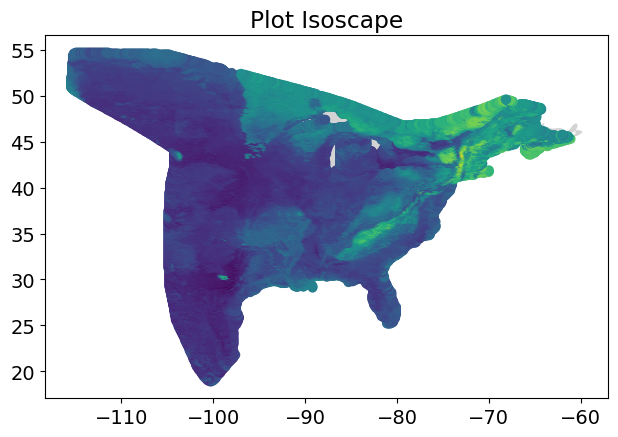

In [67]:
f, ax = plt.subplots()
studyareashp.plot(ax=ax, color='lightgrey')
final_points.plot(ax=ax, c=final_points.Prediction)
plt.title("Plot Isoscape")
plt.tight_layout()

In [50]:
final_points.Prediction.shape

(75088,)

In [68]:
filled_map_transform = scaler.transform(filled_map_no_point)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


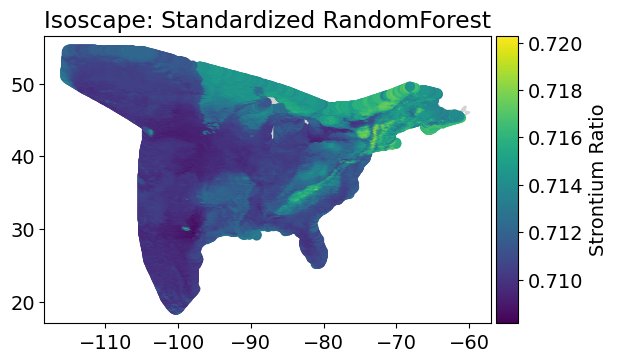

In [69]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
rf_prediction = stan_rf.predict(filled_map_transform)

final_points['Prediction'] = rf_prediction

f, ax = plt.subplots()
studyareashp.plot(ax=ax, color='lightgrey')
final_points.plot(ax=ax, c=final_points.Prediction)
plt.scatter(np.repeat(0, 75088), np.repeat(0, 75088), c=final_points.Prediction)#, alpha = 0)
plt.title("Isoscape: Standardized RandomForest", loc="left")
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar=plt.colorbar(cax=cax, label='Strontium Ratio')
ax.set_xlim(-118.35585455523456, -57.04098795272692)
ax.set_ylim(17.069134464805092, 56.56517864635329)
plt.tight_layout()

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


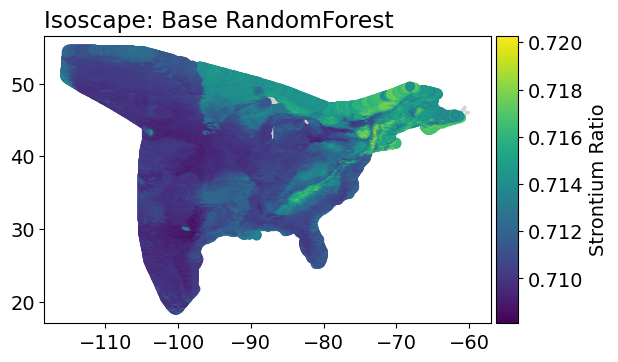

In [70]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
rf_prediction = base_rf.predict(filled_map_no_point)

final_points['Prediction'] = rf_prediction

f, ax = plt.subplots()
studyareashp.plot(ax=ax, color='lightgrey')
final_points.plot(ax=ax, c=final_points.Prediction)
plt.scatter(np.repeat(0, 75088), np.repeat(0, 75088), c=final_points.Prediction)#, alpha = 0)
plt.title("Isoscape: Base RandomForest", loc="left")
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar=plt.colorbar(cax=cax, label='Strontium Ratio')
ax.set_xlim(-118.35585455523456, -57.04098795272692)
ax.set_ylim(17.069134464805092, 56.56517864635329)
plt.tight_layout()

# Test Data

Linear Regression: -165729364.7712

In [ ]:
linreg_score = linreg.score(X_test_nopoint, y_test)
print('Random forest R2 Score:', np.round(linreg_score,4))

prediction = linreg.predict(X_test_nopoint)
mse = mean_squared_error(y_test, prediction)
rmse = mse**.5
print('RMSE:', rmse)
print('RMSE/std:', rmse/stan_dev)

Ridge Regressions: -9.4077

In [ ]:
ridge_score = ridge.score(X_test_nopoint, y_test)
print('Random forest R2 Score:', np.round(ridge_score,4))

prediction = ridge.predict(X_test_nopoint)
mse = mean_squared_error(y_test, prediction)
rmse = mse**.5
print('RMSE:', rmse)
print('RMSE/std:', rmse/stan_dev)

Decision tree: 0.2432

In [ ]:
tree_score = tree.score(X_test_nopoint, y_test)
print('Random forest R2 Score:', np.round(tree_score,4))

prediction = tree.predict(X_test_nopoint)
mse = mean_squared_error(y_test, prediction)
rmse = mse**.5
print('RMSE:', rmse)
print('RMSE/std:', rmse/stan_dev)

Base RF: 0.5223

In [ ]:
test_base_rf_score = base_rf.score(X_test_nopoint, y_test)
print('Random forest R2 Score:', np.round(test_base_rf_score,4))

prediction = base_rf.predict(X_test_nopoint)
mse = mean_squared_error(y_test, prediction)
rmse = mse**.5
print('RMSE:', rmse)
print('RMSE/std:', rmse/stan_dev)

K Neighbors: 0.138

In [ ]:
k_neigh = knn.score(X_test_nopoint, y_test)
print('K Neighbors Regression R2 Score:', np.round(k_neigh,4))

prediction = knn.predict(X_test_nopoint)
mse = mean_squared_error(y_test, prediction)
rmse = mse**.5
print('RMSE:', rmse)
print('RMSE/std:', rmse/stan_dev)

PCA RF: 0.47

In [ ]:
test_pca_rf_score = pca_rf.score(Xpca_test, y_test)
print('Random forest R2 Score:', np.round(test_pca_rf_score,4))

prediction = pca_rf.predict(Xpca_test)
mse = mean_squared_error(y_test, prediction)
rmse = mse**.5
print('RMSE:', rmse)
print('RMSE/std:', rmse/stan_dev)

Standardization RF: 0.54

In [ ]:
test_stan_rf_score = stan_rf.score(Xstan_test, y_test)
print('Random forest R2 Score:', np.round(test_stan_rf_score,4))

prediction = stan_rf.predict(Xstan_test)
mse = mean_squared_error(y_test, prediction)
rmse = mse**.5
print('RMSE:', rmse)
print('RMSE/std:', rmse/stan_dev)